Time Series Weather Forecasting

In [1]:
# importing the libraries for time series analysis on the weather forecast data
import os 
import datetime
import pandas as pd 
import numpy as np 
import matplotlib as mpl
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
import tensorflow as tf 
from statsmodels.tsa.seasonal import seasonal_decompose

In [2]:
# managing the figure size
mpl.rcParams['figure.figsize'] = (15, 8)
mpl.rcParams['axes.grid'] = False

In [3]:
# import the weather dataset
zip_path = tf.keras.utils.get_file(
    origin = 'https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip',
    fname = 'jena_climate_2009_2016.csv.zip',
    extract = True
)
csv_path, _ = os.path.splitext(zip_path)

In [4]:
# read the data in pandas dataframe
df = pd.read_csv(csv_path)

# write the csv file to the dataframe
# df.to_csv('jena_climate_2009_2016.csv')

In [5]:
df.head(20)

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3
5,01.01.2009 01:00:00,996.50,-8.05,265.38,-8.78,94.4,3.33,3.14,0.19,1.96,3.15,1307.86,0.21,0.63,192.7
6,01.01.2009 01:10:00,996.50,-7.62,265.81,-8.30,94.8,3.44,3.26,0.18,2.04,3.27,1305.68,0.18,0.63,166.5
7,01.01.2009 01:20:00,996.50,-7.62,265.81,-8.36,94.4,3.44,3.25,0.19,2.03,3.26,1305.69,0.19,0.50,118.6
8,01.01.2009 01:30:00,996.50,-7.91,265.52,-8.73,93.8,3.36,3.15,0.21,1.97,3.16,1307.17,0.28,0.75,188.5
9,01.01.2009 01:40:00,996.53,-8.43,264.99,-9.34,93.1,3.23,3.00,0.22,1.88,3.02,1309.85,0.59,0.88,185.0


In [6]:
df.tail()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
420546,31.12.2016 23:20:00,1000.07,-4.05,269.10,-8.13,73.10,4.52,3.30,1.22,2.06,3.30,1292.98,0.67,1.52,240.0
420547,31.12.2016 23:30:00,999.93,-3.35,269.81,-8.06,69.71,4.77,3.32,1.44,2.07,3.32,1289.44,1.14,1.92,234.3
420548,31.12.2016 23:40:00,999.82,-3.16,270.01,-8.21,67.91,4.84,3.28,1.55,2.05,3.28,1288.39,1.08,2.00,215.2
420549,31.12.2016 23:50:00,999.81,-4.23,268.94,-8.53,71.80,4.46,3.20,1.26,1.99,3.20,1293.56,1.49,2.16,225.8
420550,01.01.2017 00:00:00,999.82,-4.82,268.36,-8.42,75.70,4.27,3.23,1.04,2.01,3.23,1296.38,1.23,1.96,184.9


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
Tpot (K),420551.0,283.492743,8.504471,250.60,277.43,283.47,289.53,311.34
Tdew (degC),420551.0,4.955854,6.730674,-25.01,0.24,5.22,10.07,23.11
rh (%),420551.0,76.008259,16.476175,12.95,65.21,79.30,89.40,100.00
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPact (mbar),420551.0,9.533756,4.184164,0.79,6.21,8.86,12.35,28.32
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
H2OC (mmol/mol),420551.0,9.640223,4.235395,0.80,6.29,8.96,12.49,28.82


Observations:
- The data is a time series with 14 features and 1 target variable.
- The wv has some anomalies, which we have to deat with 

In [8]:
# shape of the data 
df.shape

(420551, 15)

In [9]:
# data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420551 entries, 0 to 420550
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Date Time        420551 non-null  object 
 1   p (mbar)         420551 non-null  float64
 2   T (degC)         420551 non-null  float64
 3   Tpot (K)         420551 non-null  float64
 4   Tdew (degC)      420551 non-null  float64
 5   rh (%)           420551 non-null  float64
 6   VPmax (mbar)     420551 non-null  float64
 7   VPact (mbar)     420551 non-null  float64
 8   VPdef (mbar)     420551 non-null  float64
 9   sh (g/kg)        420551 non-null  float64
 10  H2OC (mmol/mol)  420551 non-null  float64
 11  rho (g/m**3)     420551 non-null  float64
 12  wv (m/s)         420551 non-null  float64
 13  max. wv (m/s)    420551 non-null  float64
 14  wd (deg)         420551 non-null  float64
dtypes: float64(14), object(1)
memory usage: 48.1+ MB


In [10]:
# let's do the sampling of the data by Date time column for every 2 hours
# slice [start:stop:stop], starting from index1 11 taek every 12th record
df = df[11::12]
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
11,01.01.2009 02:00:00,996.62,-8.88,264.54,-9.77,93.2,3.12,2.90,0.21,1.81,2.91,1312.25,0.25,0.63,190.3
23,01.01.2009 04:00:00,996.99,-9.05,264.34,-10.02,92.6,3.07,2.85,0.23,1.78,2.85,1313.61,0.10,0.38,240.0
35,01.01.2009 06:00:00,997.71,-9.67,263.66,-10.62,92.7,2.93,2.71,0.21,1.69,2.72,1317.71,0.05,0.50,146.0
47,01.01.2009 08:00:00,999.17,-8.10,265.12,-9.05,92.8,3.31,3.07,0.24,1.92,3.08,1311.65,0.72,1.25,213.9
59,01.01.2009 10:00:00,1000.27,-7.04,266.10,-8.17,91.6,3.60,3.30,0.30,2.05,3.29,1307.76,1.45,3.00,292.6


In [11]:
df.shape

(35045, 15)

In [12]:
# poping the date time column
date_time = pd.to_datetime(df.pop('Date Time'), format='%d.%m.%Y %H:%M:%S')
df.head()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
11,996.62,-8.88,264.54,-9.77,93.2,3.12,2.90,0.21,1.81,2.91,1312.25,0.25,0.63,190.3
23,996.99,-9.05,264.34,-10.02,92.6,3.07,2.85,0.23,1.78,2.85,1313.61,0.10,0.38,240.0
35,997.71,-9.67,263.66,-10.62,92.7,2.93,2.71,0.21,1.69,2.72,1317.71,0.05,0.50,146.0
47,999.17,-8.10,265.12,-9.05,92.8,3.31,3.07,0.24,1.92,3.08,1311.65,0.72,1.25,213.9
59,1000.27,-7.04,266.10,-8.17,91.6,3.60,3.30,0.30,2.05,3.29,1307.76,1.45,3.00,292.6


In [13]:
df.columns

Index(['p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)', 'rh (%)',
       'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)'],
      dtype='object')

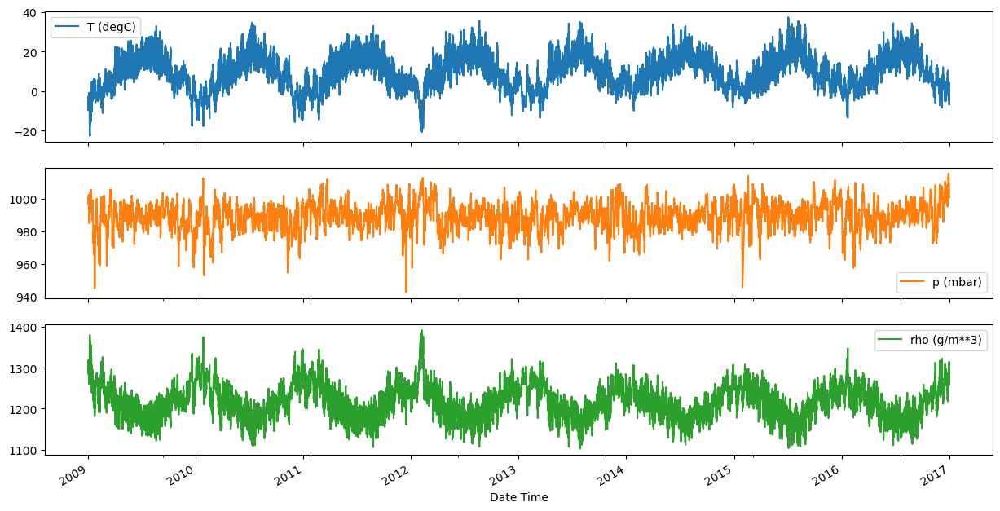

In [14]:
# let's plot the data
plot_cols = ['T (degC)', 'p (mbar)', 'rho (g/m**3)']
plot_features = df[plot_cols]
plot_features.index = date_time
_ = plot_features.plot(subplots=True)

In [15]:
# let's plot the same plot in plotly 
fig = px.line(df, x=date_time, y='T (degC)', title='Temperature over time')
fig.update_traces(line_color='red')
fig.show()
fig = px.line(df, x=date_time, y='p (mbar)', title='Pressure over time')
fig.update_traces(line_color='blue')
fig.show()
fig = px.line(df, x=date_time, y='rho (g/m**3)', title='Density over time')
fig.update_traces(line_color='green')
fig.show()

c:\Users\Muhammad Haroon\.conda\envs\tf_env\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


c:\Users\Muhammad Haroon\.conda\envs\tf_env\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



c:\Users\Muhammad Haroon\.conda\envs\tf_env\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



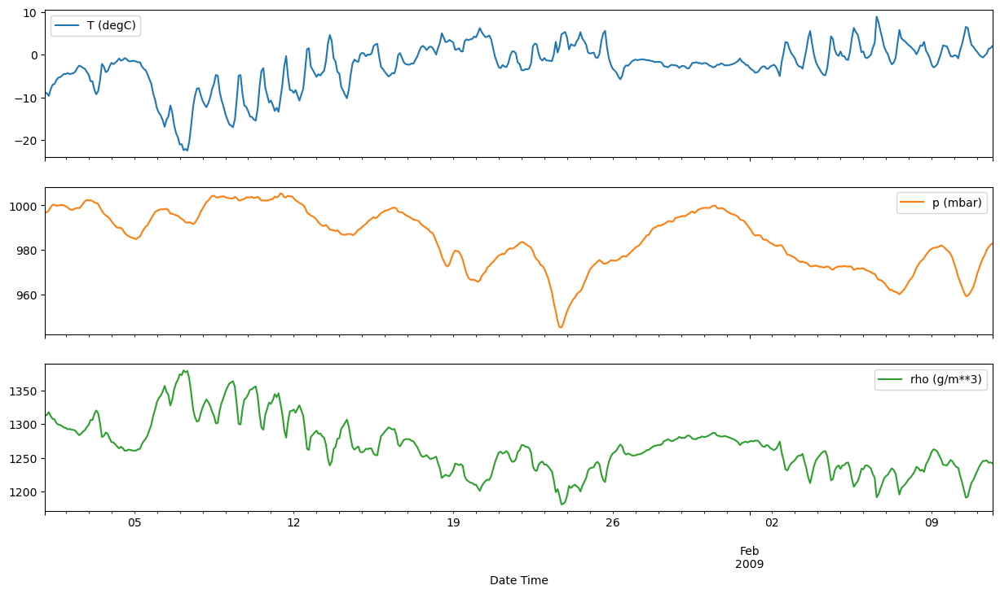

In [16]:
# let's plot the data only first 1000 hours 
plot_cols = ['T (degC)', 'p (mbar)', 'rho (g/m**3)']
plot_features = df[plot_cols][:500]
plot_features.index = date_time [:500]
_ = plot_features.plot(subplots=True)

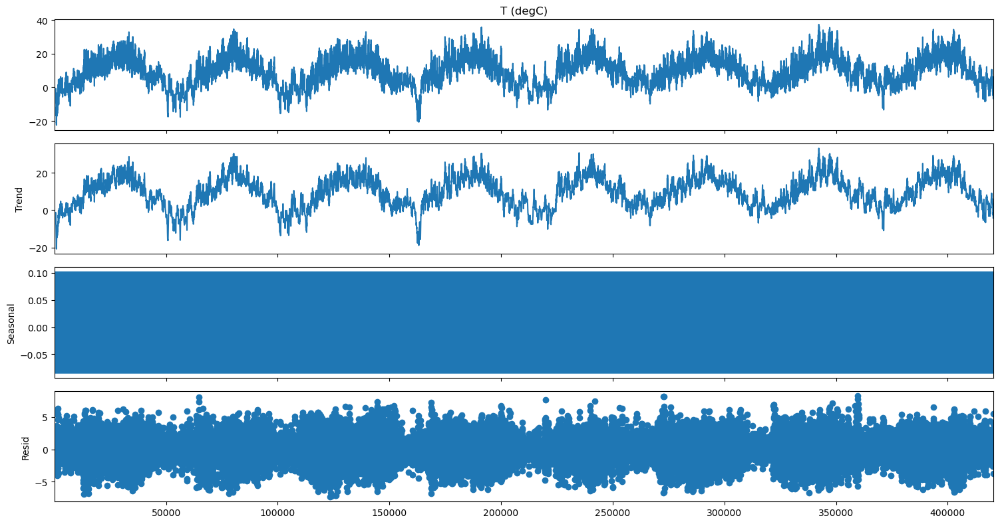

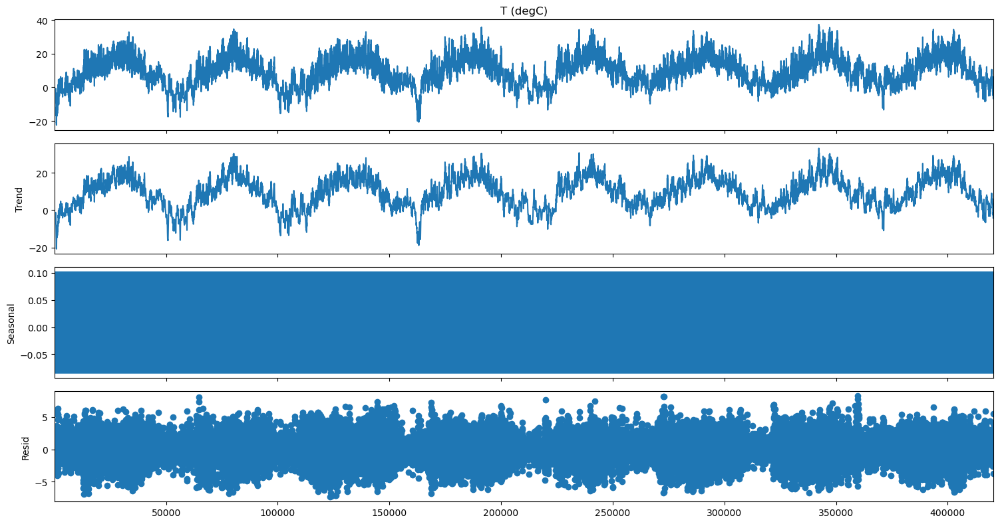

In [17]:
# let's decompose the data into trend, seasonality and noise
# we will use the seasonal_decompose function from the statsmodels library
result = seasonal_decompose(df['T (degC)'], model='additive', period=8)
result.plot()

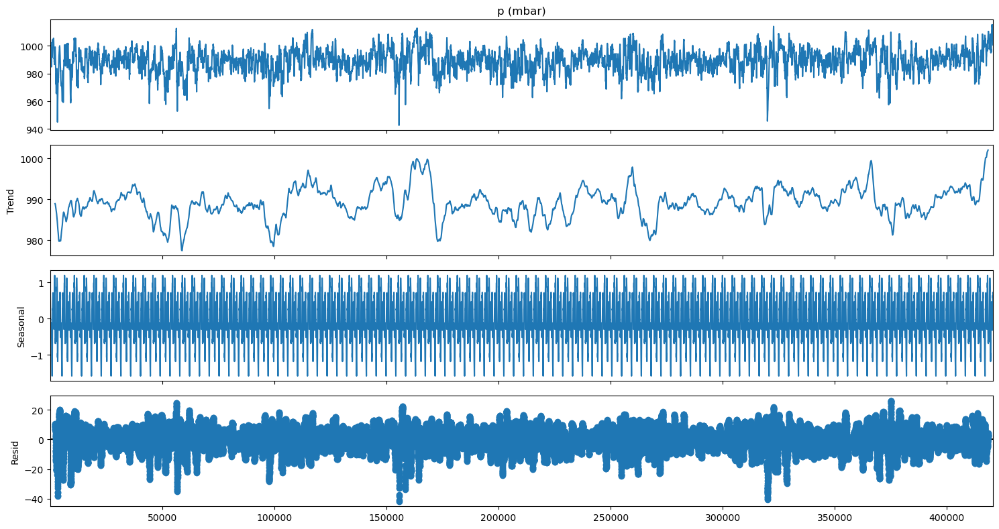

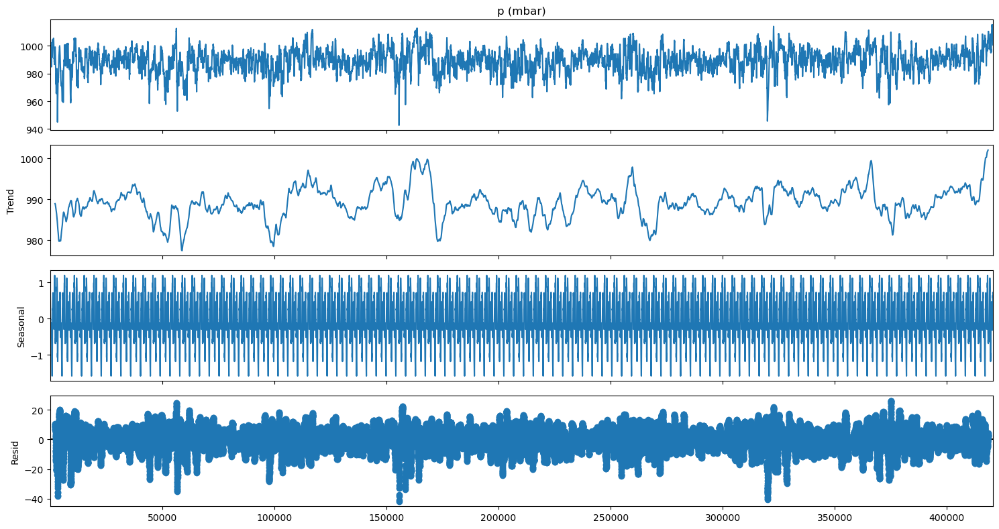

In [18]:
# let's decompose the data into trend, seasonality and noise
result = seasonal_decompose(df['p (mbar)'], model='additive', period=365)
result.plot()

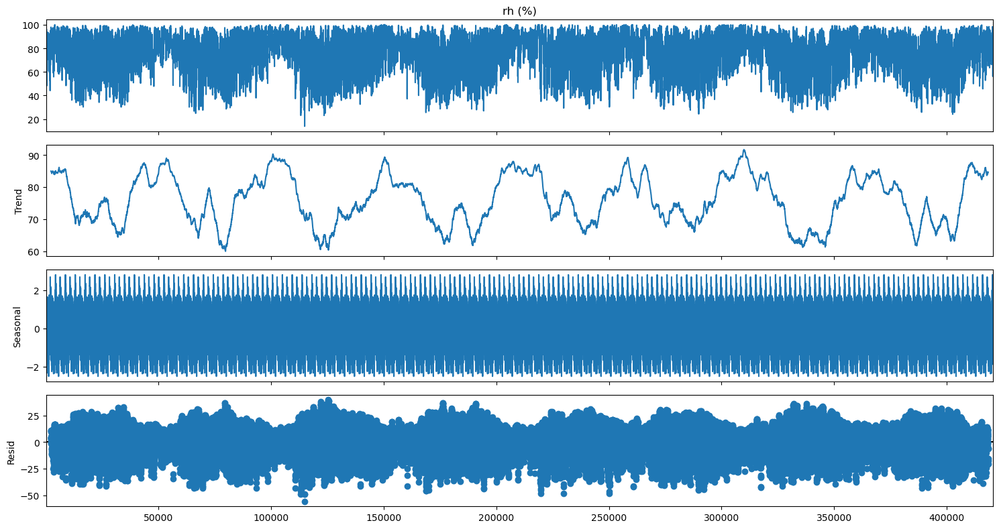

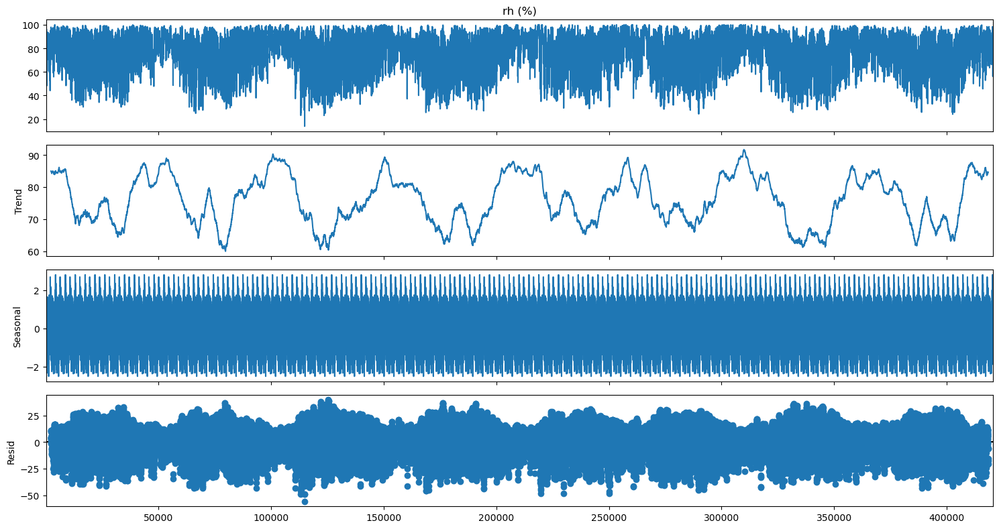

In [19]:
# let's decompose the data into trend, seasonality and noise
# we will use the seasonal_decompose function from the statsmodels library
result = seasonal_decompose(df['rh (%)'], model='additive', period=365)
result.plot()

In [20]:
# let's clean up the data
# let's check for the missing values in the data
df.isna().sum()

p (mbar)           0
T (degC)           0
Tpot (K)           0
Tdew (degC)        0
rh (%)             0
VPmax (mbar)       0
VPact (mbar)       0
VPdef (mbar)       0
sh (g/kg)          0
H2OC (mmol/mol)    0
rho (g/m**3)       0
wv (m/s)           0
max. wv (m/s)      0
wd (deg)           0
dtype: int64

In [21]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
p (mbar),35045.0,989.213079,8.353850,942.65,984.20,989.57,994.72,1015.16
T (degC),35045.0,9.450335,8.425301,-22.50,3.36,9.43,15.49,37.28
Tpot (K),35045.0,283.492908,8.506133,251.22,277.44,283.48,289.55,311.21
Tdew (degC),35045.0,4.955012,6.729168,-24.55,0.24,5.22,10.08,22.19
rh (%),35045.0,76.006020,16.483440,13.88,65.15,79.30,89.50,100.00
VPmax (mbar),35045.0,13.577314,7.743076,0.99,7.77,11.83,17.62,63.77
VPact (mbar),35045.0,9.532714,4.181965,0.83,6.22,8.86,12.36,26.79
VPdef (mbar),35045.0,4.044542,4.902793,0.00,0.87,2.18,5.30,46.01
sh (g/kg),35045.0,6.021744,2.654692,0.52,3.92,5.60,7.81,17.13
H2OC (mmol/mol),35045.0,9.639148,4.233082,0.83,6.29,8.97,12.49,27.25


In [22]:
wv = df['wv (m/s)']
bad_wv = wv == -9999.0
wv[bad_wv] = 0.0

In [23]:
max_wv = df['max. wv (m/s)']
bad_max_wv = max_wv == -9999.0
max_wv[bad_max_wv] = 0.0

Text(0, 0.5, 'Wind Velocity [m/s]')

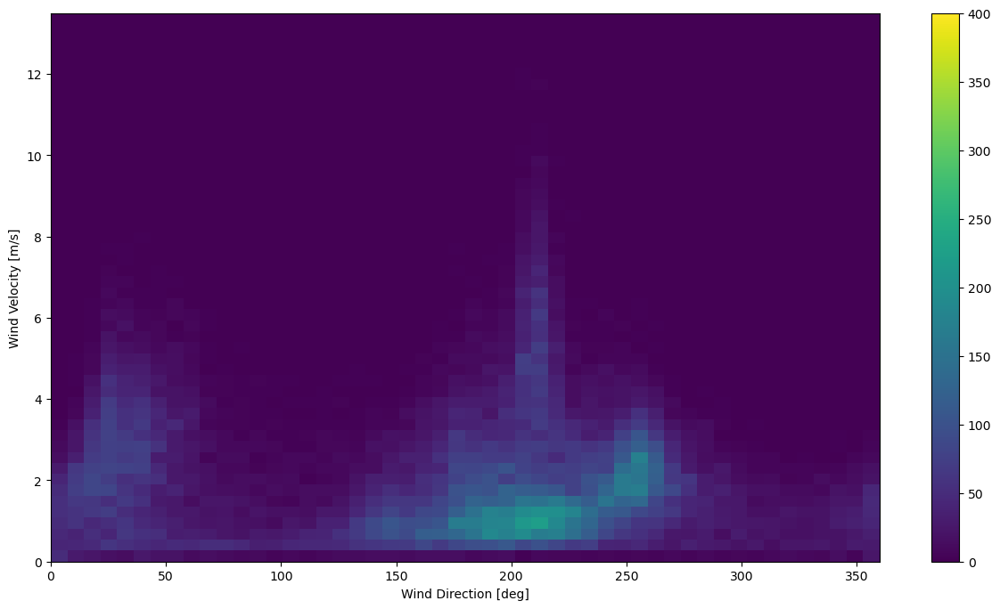

In [24]:
# distribution of the wind speed
plt.hist2d(df['wd (deg)'], df['wv (m/s)'], bins=(50, 50), vmax=400)
plt.colorbar()
plt.xlabel('Wind Direction [deg]')
plt.ylabel('Wind Velocity [m/s]')

In [25]:
# nodel to interpret the wind direction and velocity columns to a wind vector
wv = df.pop('wv (m/s)')
max_wv = df.pop('max. wv (m/s)')

# convert to radians
wd_rad = df.pop('wd (deg)')*np.pi / 180

# calculate the wind x and y components
df['Wx'] = wv*np.cos(wd_rad)
df['Wy'] = wv*np.sin(wd_rad)

# calculate the max wind x and y components
df['max Wx'] = max_wv*np.cos(wd_rad)
df['max Wy'] = max_wv*np.sin(wd_rad)

(-11.283399378471648, 7.828866983563616, -7.502379787471679, 7.461711712706028)

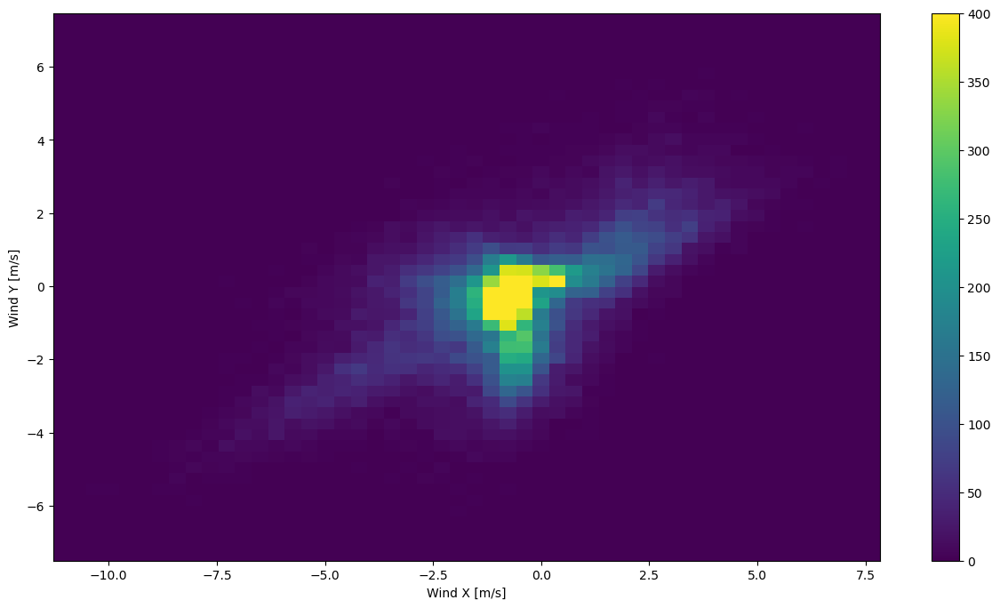

In [26]:
# distribution of wind vector components 
plt.hist2d(df['Wx'], df['Wy'], bins=(50, 50), vmax=400)
plt.colorbar()
plt.xlabel('Wind X [m/s]')
plt.ylabel('Wind Y [m/s]')
ax = plt.gca()
ax.axis('tight')

In [27]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
p (mbar),35045.0,989.213079,8.353850,942.650000,984.200000,989.570000,994.720000,1015.160000
T (degC),35045.0,9.450335,8.425301,-22.500000,3.360000,9.430000,15.490000,37.280000
Tpot (K),35045.0,283.492908,8.506133,251.220000,277.440000,283.480000,289.550000,311.210000
Tdew (degC),35045.0,4.955012,6.729168,-24.550000,0.240000,5.220000,10.080000,22.190000
rh (%),35045.0,76.006020,16.483440,13.880000,65.150000,79.300000,89.500000,100.000000
VPmax (mbar),35045.0,13.577314,7.743076,0.990000,7.770000,11.830000,17.620000,63.770000
VPact (mbar),35045.0,9.532714,4.181965,0.830000,6.220000,8.860000,12.360000,26.790000
VPdef (mbar),35045.0,4.044542,4.902793,0.000000,0.870000,2.180000,5.300000,46.010000
sh (g/kg),35045.0,6.021744,2.654692,0.520000,3.920000,5.600000,7.810000,17.130000
H2OC (mmol/mol),35045.0,9.639148,4.233082,0.830000,6.290000,8.970000,12.490000,27.250000


In [28]:
# split the data into train, validation and test, 70% train, 20% validation and 10% test
# 70% of 35045 is 24531
# 20% of 35045 is 7009
# 10% of 35045 is 3504
# train data
train_df = df[:24531]
# validation data
val_df = df[24531:31540]
# test data
test_df = df[31540:]

#let's check the shape of the data
train_df.shape, val_df.shape, test_df.shape

((24531, 15), (7009, 15), (3505, 15))

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >], dtype=object)

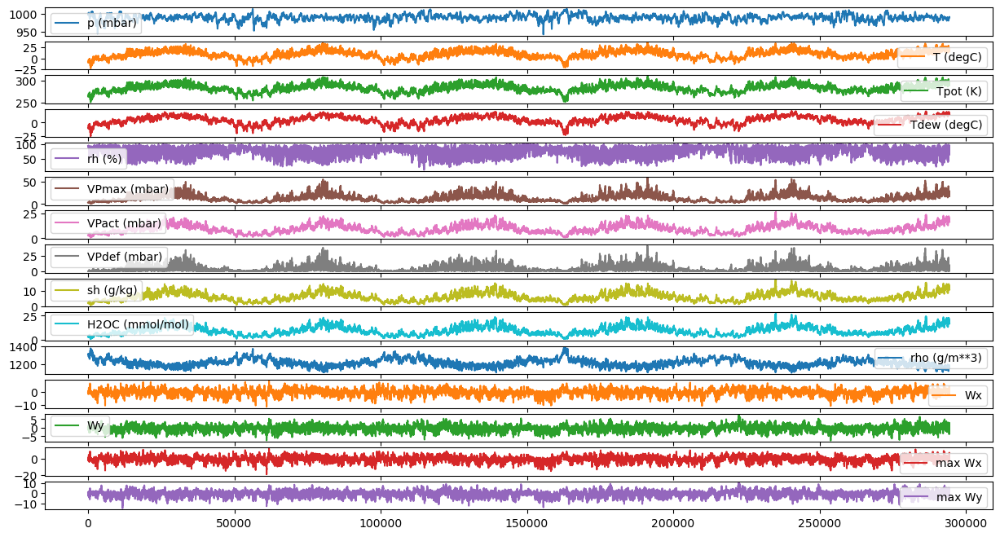

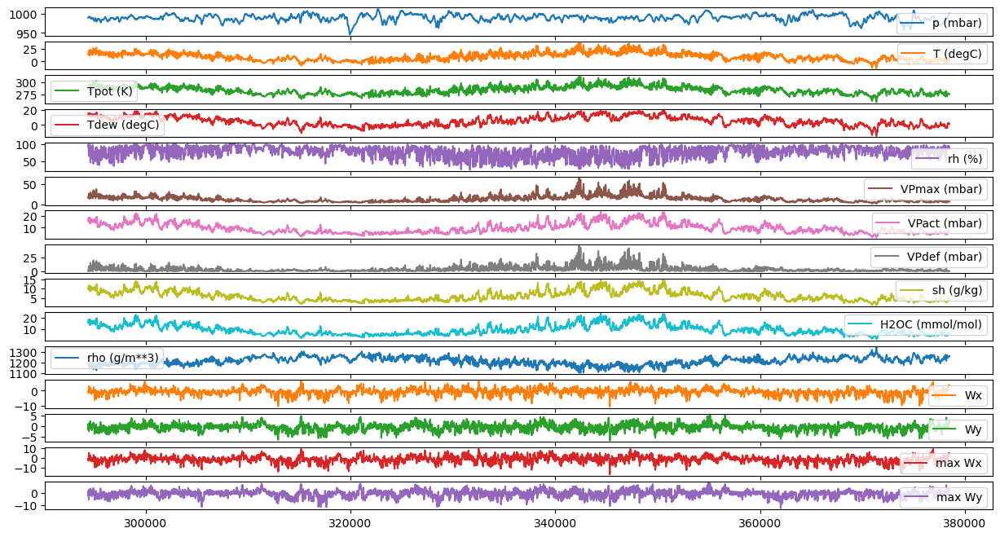

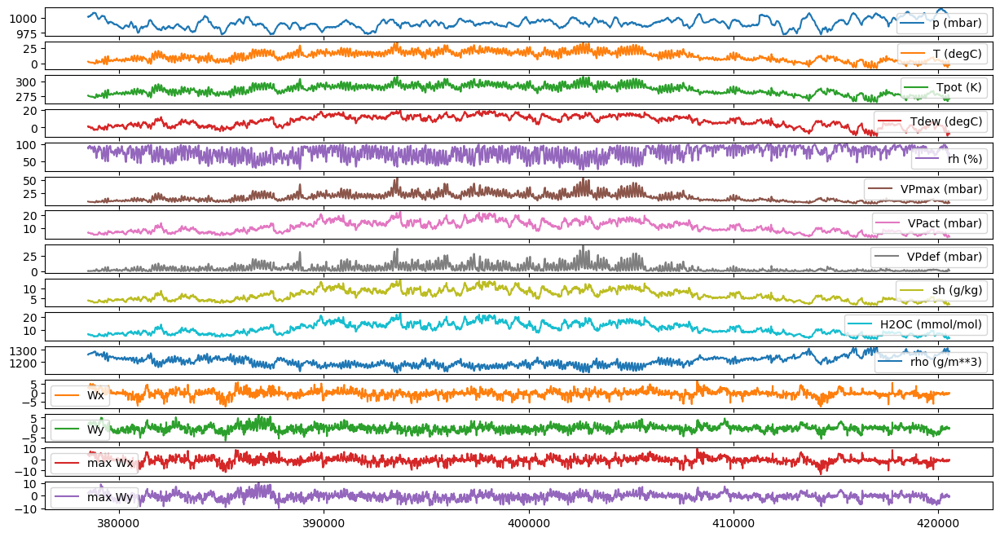

In [29]:
# let's plot the data for the training, validation and test data
train_df.plot(subplots=True)
val_df.plot(subplots=True)
test_df.plot(subplots=True)

In [30]:
# let's normalize the data
# we will use the mean and standard deviation of the training data to normalize the validation and test data
# this is to prevent data leakage
train_mean = train_df.mean()
train_std = train_df.std()

# normalize the training data
train_df = (train_df - train_mean) / train_std
# normalize the validation data
val_df = (val_df - train_mean) / train_std
# normalize the test data
test_df = (test_df - train_mean) / train_std

C:\Users\Muhammad Haroon\AppData\Local\Temp\ipykernel_8088\3214313372.py:5: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



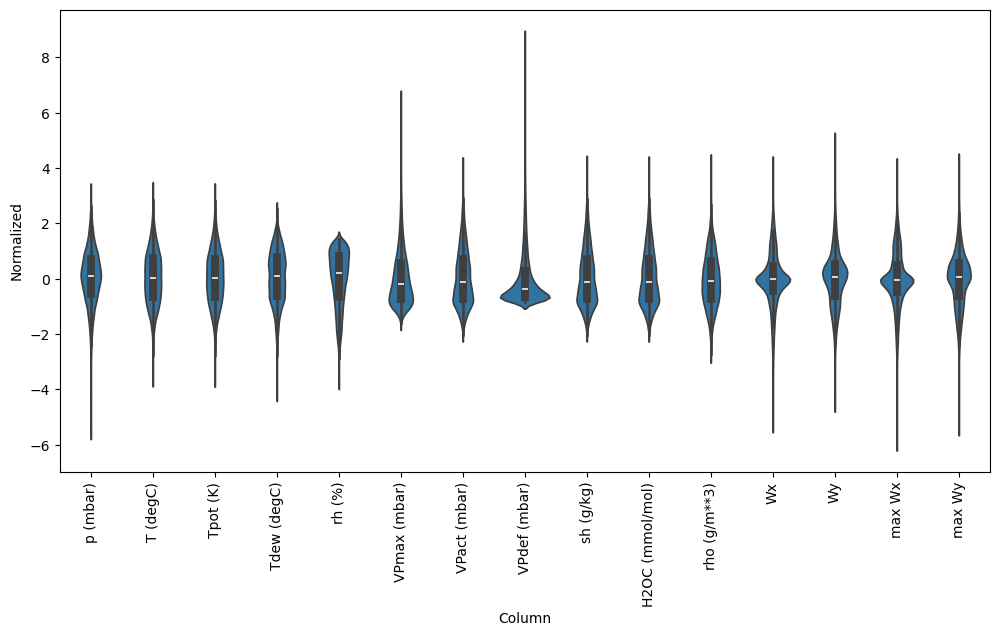

In [31]:
df_std = (df - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >], dtype=object)

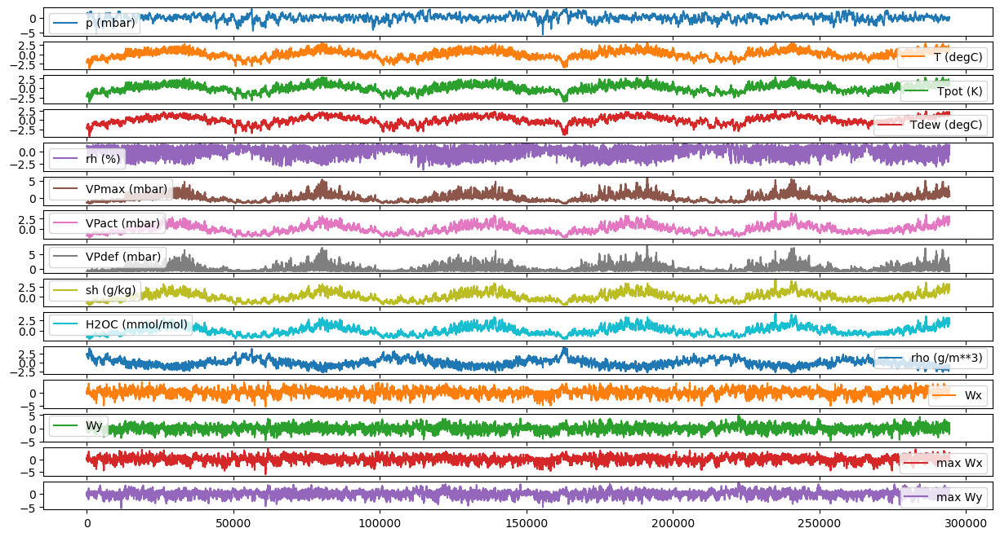

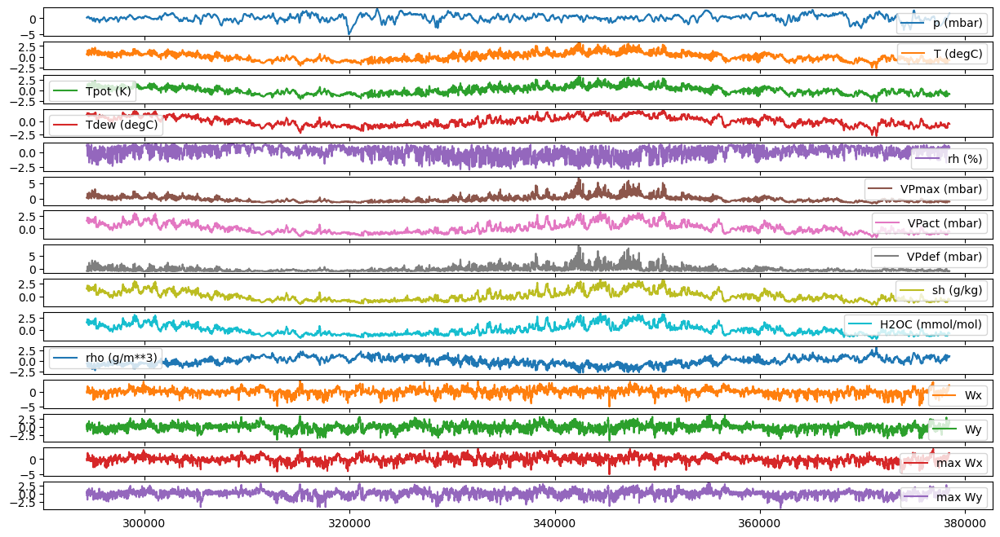

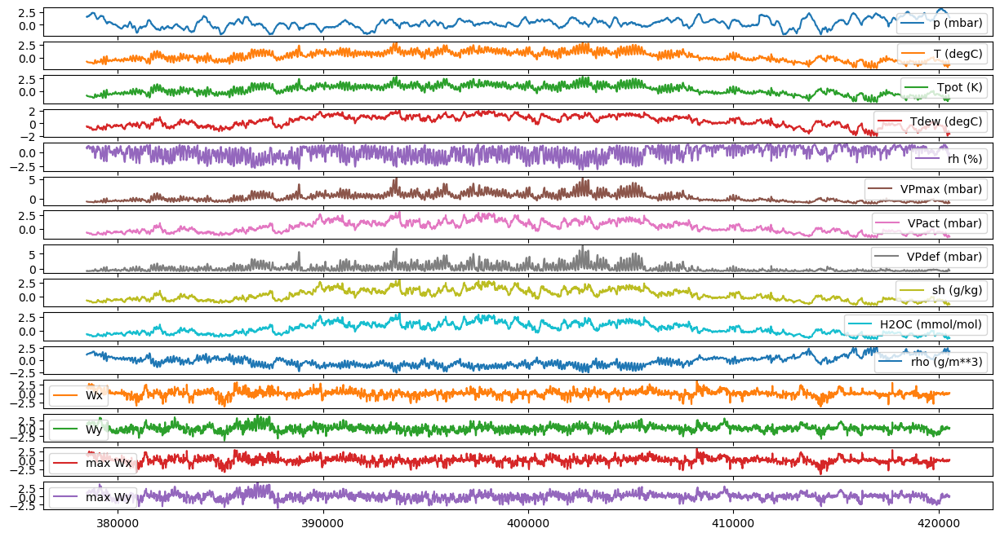

In [32]:
# let's plot the normalized data
train_df.plot(subplots=True)
val_df.plot(subplots=True)
test_df.plot(subplots=True)

In [33]:
# Time to create the data window
timestamp_s = date_time.map(pd.Timestamp.timestamp)

In [34]:
# usable signals using the sine and cosine transforms to clear the time of day and time of year
day = 24*60*60
year = (365.2425)*day

df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

Text(0.5, 1.0, 'Time of day signal')

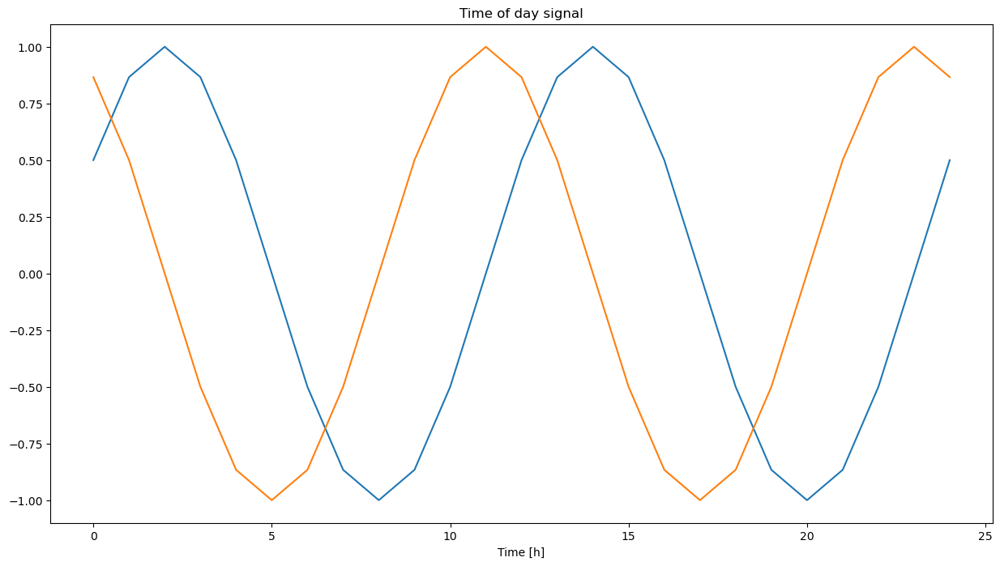

In [35]:
plt.plot(np.array(df['Day sin'])[:25])
plt.plot(np.array(df['Day cos'])[:25])
plt.xlabel('Time [h]')
plt.title('Time of day signal')